In [53]:
import sys
sys.path.insert(1, "../TransformerLens/")


from transformer_lens.HookedViT import HookedViT
from transformer_lens.HookedViTConfig import HookedViTConfig
from transformer_lens.loading_from_pretrained import convert_vit_weights, convert_clip_weights
from transformers import AutoProcessor, AutoImageProcessor, ViTForImageClassification, CLIPProcessor, CLIPVisionModelWithProjection, ViTConfig
from transformers import logging
logging.set_verbosity_error()

import torch
torch.set_grad_enabled(False)

from PIL import Image
import numpy as np
import pickle
import glob
import circuitsvis as cv
import plotly.io as pio
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 100

pio.renderers.default = "notebook_connected"

from IPython import get_ipython
ip = get_ipython()
if not ip.extension_manager.loaded:
    ip.extension_manager.load('autoreload')
    %autoreload 2

In [74]:
class Model:
    '''Wrapper class for model + image_processor'''
    def __init__(self, model, image_processor):
        self.model = model
        self.image_processor = image_processor
        
    def __call__(self, im):
        im = self.preprocess(im)
        return self.model(im)
    
    def preprocess(self, im):
        if str(type(self.image_processor)) == "<class 'transformers.models.clip.processing_clip.CLIPProcessor'>":
            im = self.image_processor(images=test_im, return_tensors='pt')["pixel_values"].to("mps")
        else:
            im = self.image_processor(test_im, return_tensors='pt')["pixel_values"].to("mps")
            
        return im

def load_model(pretrain="scratch", patch_size=32):
    '''
    :param pretrain: "scratch", "imagenet", "clip"
    :param patch_size: 16, 32
    '''
    if pretrain == "scratch" or pretrain == "imagenet":
        hf_model = ViTForImageClassification.from_pretrained(f"google/vit-base-patch{patch_size}-224-in21k", num_labels=2).to("mps")
        tl_model = HookedViT.from_pretrained(f"google/vit-base-patch{patch_size}-224-in21k")
        image_processor = AutoImageProcessor.from_pretrained(f"google/vit-base-patch{patch_size}-224-in21k")

    elif pretrain == "clip":
        hf_model = CLIPVisionModelWithProjection.from_pretrained(f"openai/clip-vit-base-patch{patch_size}")
        tl_model = HookedViT.from_pretrained(f"openai/clip-vit-base-patch{patch_size}", is_clip=True)
        image_processor = AutoProcessor.from_pretrained(f"openai/clip-vit-base-patch{patch_size}")
        
        in_features = hf_model.visual_projection.in_features
        hf_model.visual_projection = torch.nn.Linear(in_features, 2)
        tl_model.classifier_head.W = hf_model.visual_projection.weight
        
    model_path = glob.glob(f"models/{pretrain}_vit{patch_size}/*.pth")[0]
    model_file = torch.load(model_path, map_location=torch.device("mps"))
    
    if pretrain == "clip":
        model_file["vision_model.embeddings.position_ids"] = hf_model.vision_model.embeddings.position_ids

    hf_model.load_state_dict(model_file)
    
    if pretrain == "clip":
        state_dict = convert_clip_weights(hf_model, tl_model.cfg)
    else:
        state_dict = convert_vit_weights(hf_model, tl_model.cfg)
    tl_model.load_state_dict(state_dict, strict=False)
    
    model = Model(tl_model.to("mps"), image_processor)
    return model

def imshow(im, white_grid=False, black_grid=False, red_grid=False, grid_size=16, numbers=True):
    if white_grid or black_grid or red_grid:
        if numbers:
            num_str = "num"
        else:
            num_str = ""
            
        grid_im = Image.open(f"stimuli/grid{32}{num_str}.png")
        grid_data = grid_im.getdata()
        
        new_data = []
        for item in grid_data:
            if item[0] < 100 and item[1] < 100 and item[2] < 100:
                new_data.append((0, 0, 0, 0))
            else:
                if white_grid:
                    new_data.append(item)
                elif red_grid:
                    new_data.append((255, 0, 0, 255))
                else:
                    new_data.append((0, 0, 0, 255))
                
        grid_im.putdata(new_data)
        
        bg = im.copy()
        bg.paste(grid_im, (0, 0), grid_im)
        
        plt.imshow(bg) 
        plt.tick_params(
                axis='both',          
                which='both',      
                bottom=False,      
                top=False, 
                left=False,
                labelbottom=False,
                labelleft=False)
    else:
        plt.imshow(im) 
        plt.tick_params(
                axis='both',          
                which='both',      
                bottom=False,      
                top=False, 
                left=False,
                labelbottom=False,
                labelleft=False)

In [68]:
model = load_model(pretrain="clip", patch_size=32)

If using ViT for interpretability research, keep in mind that ViT has some significant architectural differences to GPT. For example, LayerNorms are applied *after* the attention and MLP components, meaning that the last LayerNorm in a block cannot be folded.


Moving model to device:  mps
Loaded pretrained model openai/clip-vit-base-patch32 into HookedTransformer
Moving model to device:  mps


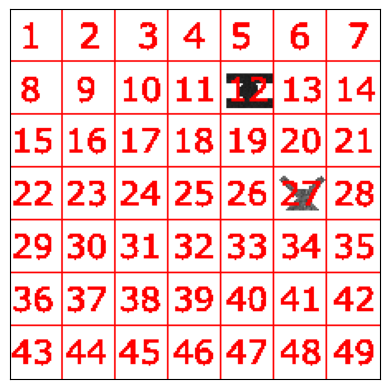

In [77]:
test_im = Image.open(f"stimuli/NOISE/aligned/N_32/trainsize_6400_256-256-256/val/different/3194.png").convert("RGB")
imshow(test_im, red_grid=True, grid_size=32)
test_im = model.preprocess(test_im)
#test_im = image_processor(test_im, return_tensors='pt')["pixel_values"].to("mps")

In [78]:
logits, cache = model.model.run_with_cache(test_im, remove_batch_dim=True)

In [90]:
attention_pattern = cache["pattern", 2, "attn"]
tokens = [str(i) for i in range(1, attention_pattern.shape[1])]
tokens = ["CLS"] + tokens
cv.attention.attention_patterns(tokens=tokens, attention=attention_pattern)
#tokens[test_im_data["pos1"] + 1] = f"{test_im_data['pos1']} (obj1)"
#tokens[test_im_data["pos2"] + 1] = f"{test_im_data['pos2']} (obj2)"

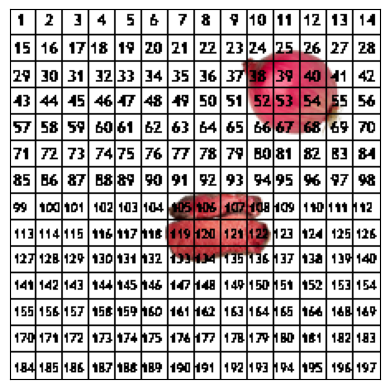

In [7]:
test_im2 = Image.open(f"../same-different-transformers/stimuli/OBJECTSALL/test/different/AMEAT2_redonion_23.png")
imshow(test_im2, black_grid=True)
test_im2 = image_processor(images=test_im2, return_tensors='pt')["pixel_values"].to("mps")

In [8]:
vit_logits2, vit_cache2 = tl_model.run_with_cache(test_im2, remove_batch_dim=True)

In [9]:
attention_pattern = vit_cache2["pattern", 0, "attn"]
tokens = [str(i) for i in range(1, attention_pattern.shape[1])]
tokens = ["CLS"] + tokens
cv.attention.attention_patterns(tokens=tokens, attention=attention_pattern)

In [5]:
datadir = "stimuli/NOISE/aligned/N_32/trainsize_6400_256-256-256"
datadict = pickle.load(open(f"{datadir}/train/datadict.pkl", "rb"))

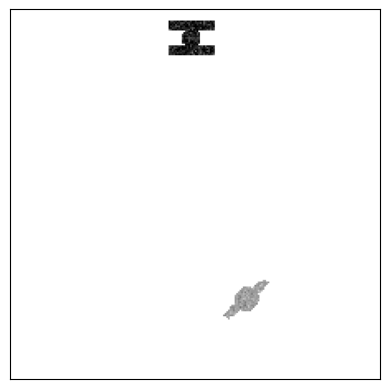

In [6]:
test_idx = 80
test_im = Image.open(f"{datadir}/train/different/{test_idx}.png")
test_im_data = datadict[f"train/different/{test_idx}.png"]
imshow(test_im)
test_im = image_processor.preprocess(np.array(test_im, dtype=np.float32), return_tensors='pt')["pixel_values"].to("mps")

In [7]:
vit_logits, vit_cache = tl_model.run_with_cache(test_im, remove_batch_dim=True)

In [13]:
attention_pattern = vit_cache["pattern", 0, "attn"]
tokens = [str(i) for i in range(1, attention_pattern.shape[1])]
tokens = ["CLS"] + tokens
tokens[test_im_data["pos1"] + 1] = f"{test_im_data['pos1']} (obj1)"
tokens[test_im_data["pos2"] + 1] = f"{test_im_data['pos2']} (obj2)"

In [14]:
cv.attention.attention_patterns(tokens=tokens, attention=attention_pattern)

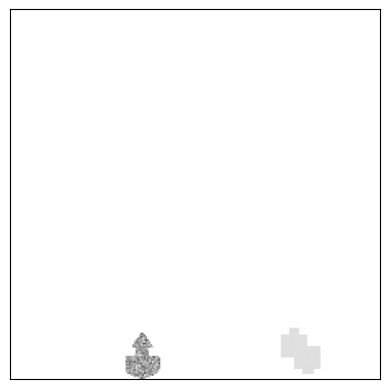

In [144]:
test_idx = 100
test_im = Image.open(f"{datadir}/train/different/{test_idx}.png")
test_im_data = datadict[f"train/different/{test_idx}.png"]
imshow(test_im)
test_im = image_processor.preprocess(np.array(test_im, dtype=np.float32), return_tensors='pt')["pixel_values"].to("mps")

In [147]:
vit_logits, vit_cache = tl_model.run_with_cache(test_im, remove_batch_dim=True)

attention_pattern = vit_cache["pattern", 10, "attn"]
tokens = [str(i) for i in range(1, attention_pattern.shape[1])]
tokens = ["CLS"] + tokens
tokens[test_im_data["pos1"] + 1] = f"{test_im_data['pos1']} (obj1)"
tokens[test_im_data["pos2"] + 1] = f"{test_im_data['pos2']} (obj2)"

cv.attention.attention_patterns(tokens=tokens, attention=attention_pattern)